In [1]:
import glob
from itertools import product

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import read_json_log, scatterdots, scatterjitter

from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.transform import jitter
output_notebook()

Loading BokehJS ...

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

### read experiment logs and preprocess metrics

In [4]:
files = glob.glob('./experiments/*.log')
df = pd.concat([read_json_log(f) for f in files], ignore_index=True)
df = df[df.success == True].rename(lambda x: x.replace('_score', ''), axis='columns')

In [5]:
metrics = ['accuracy', 'average_precision', 'f1', 'log_loss', 'precision', 'recall', 'roc_auc']
folds = ['split' + str(i) for i in range(0, 5)]

In [6]:
for t, m in product(['train', 'test', 'val'], metrics):
    b = '_' + t + '_' + m
    c = [f + b for f in folds]
    df['mean' + b] = df[c].mean(axis=1)
    df['range' + b] = df[c].max(axis=1) - df[c].min(axis=1)
    df.drop(c, axis=1, inplace=True)

for m in metrics:
    df['test_overfit_' + m] = df['mean_train_' + m] - df['mean_test_' + m]
    df['val_test_diff_' + m] = df['mean_test_' + m] - df['mean_val_' + m]

train_time_cols = [f + '_train_time' for f in folds]
df['mean_train_time'] = df[train_time_cols].mean(axis=1)
pred_time_cols = [f + '_pred_time' for f in folds]
df['mean_pred_time'] = df[pred_time_cols].mean(axis=1)
df.drop(train_time_cols + pred_time_cols, axis=1, inplace=True)

iteration_cols = [f + '_best_iteration' for f in folds]
df['mean_best_iteration'] = df[iteration_cols].mean(axis=1)
df['range_best_iteration'] = df[iteration_cols].max(axis=1) - df[iteration_cols].min(axis=1)

df.drop(iteration_cols, axis=1, inplace=True)

### dependencies between classification metrics on validation dataset

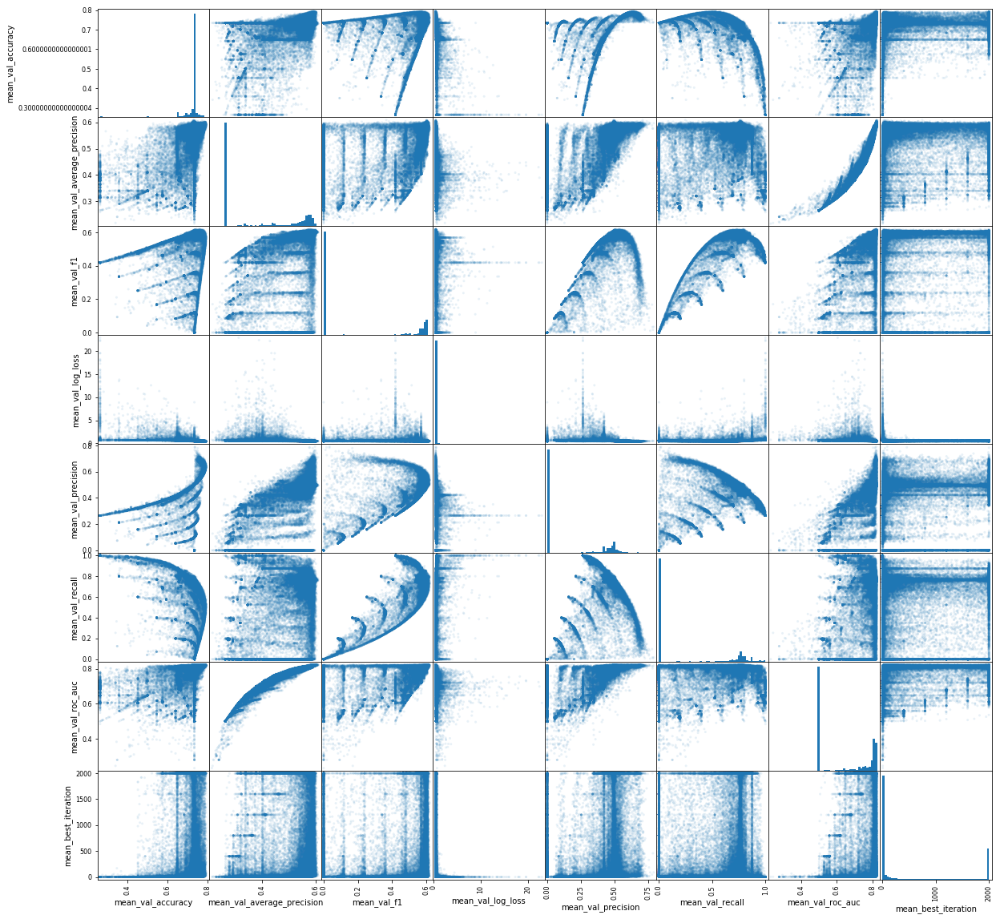

In [7]:
pd.plotting.scatter_matrix(df[['mean_val_' + m for m in metrics] + ['mean_best_iteration']], alpha=0.1, 
                           figsize=(20, 20), hist_kwds={'bins': 50});

In [10]:
all_parameters = df.filter(like='param_', axis='columns')\
    .drop('param_seed', axis='columns')\
    .dropna(how='all', axis='columns')\
    .pipe(lambda x: x.loc[:, x.nunique() != 1])\
    .columns.values

cont_parameters = [
    'param_bagging_fraction',
    'param_feature_fraction',
    'mean_best_iteration'
]

log_parameters = [
    'param_learning_rate',
    'param_min_sum_hessian_in_leaf',
    'param_max_delta_step',
    'param_lambda_l1', 
    'param_lambda_l2',
    'param_min_gain_to_split', 
    'param_cat_l2',
    'param_scale_pos_weight'
]

set_parameters = [
    'param_is_unbalance', 
    'param_boost_from_average',
]

int_parameters = [
    'param_num_leaves',
    'param_max_depth',
    'param_min_data_in_leaf',
    'param_bagging_freq',
    'param_min_data_per_group',
    'param_max_cat_threshold',
    'param_cat_smooth', 
    'param_max_cat_to_onehot', 
    'param_max_bin',
    'param_min_data_in_bin',
    'param_bin_construct_sample_cnt',
]

set(all_parameters) - (set(cont_parameters) | set(log_parameters) | set(set_parameters) | set(int_parameters))

set()

### check how parameters affect roc_auc

bigger bagging_fraction is better (need to check overfit later)

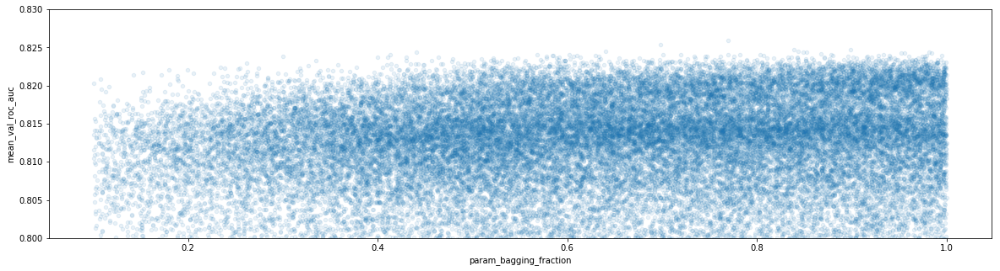

In [25]:
df.plot(x='param_bagging_fraction', y='mean_val_roc_auc', kind='scatter', alpha=0.1, ylim=(0.8, 0.83));

20 iterations is enough to reach good roc_auc

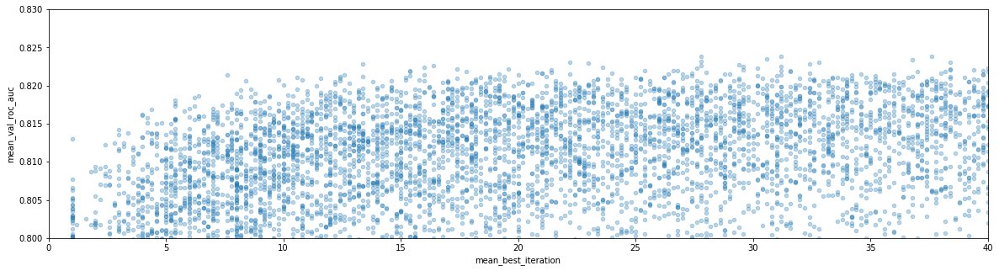

In [28]:
df.plot(x='mean_best_iteration', y='mean_val_roc_auc', kind='scatter', alpha=0.3, ylim=(0.8, 0.83), xlim=(0, 40));

setting learning_rate too small decreases roc_auc (remember that max_iteration was capped at 2000)

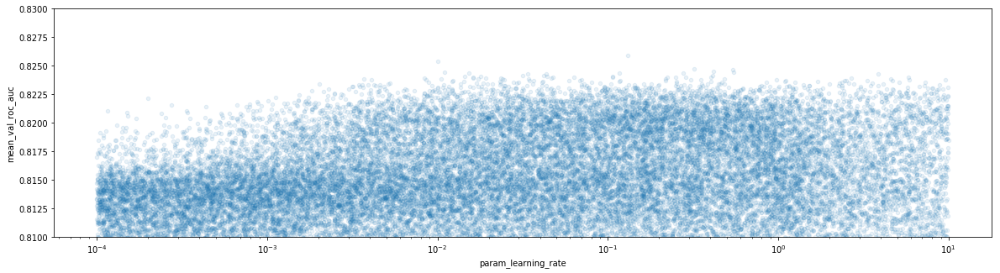

In [31]:
df.plot(x='param_learning_rate', y='mean_val_roc_auc', kind='scatter', alpha=0.1, ylim=(0.81, 0.83), logx=True);

don't set lambda_l1 too large

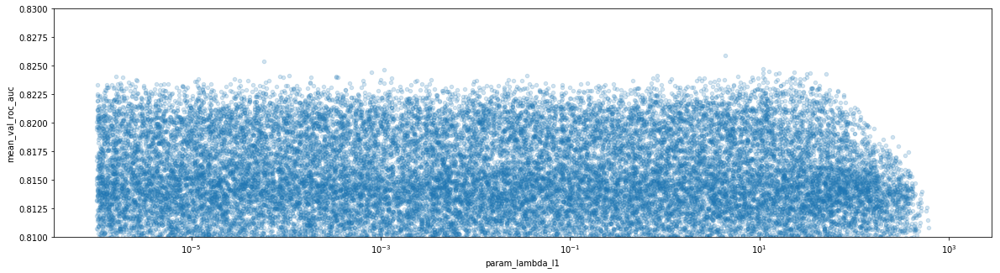

In [36]:
df.plot(x='param_lambda_l1', y='mean_val_roc_auc', kind='scatter', alpha=0.2, 
        ylim=(0.81, 0.83), logx=True);

same for min_gain_to_split

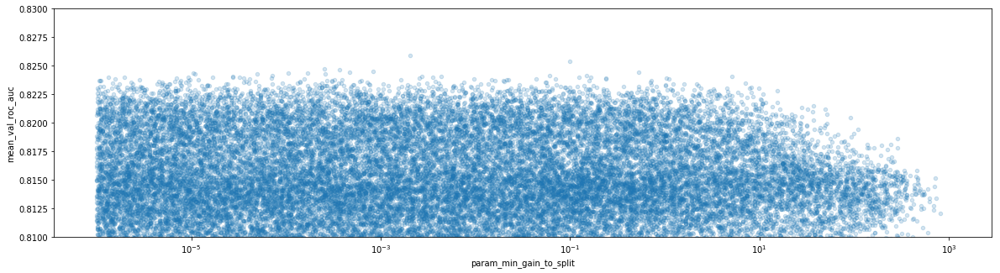

In [37]:
df.plot(x='param_min_gain_to_split', y='mean_val_roc_auc', kind='scatter', alpha=0.2, 
        ylim=(0.81, 0.83), logx=True);

increasing min_data_in_leaf slightly decreases maximum roc_auc

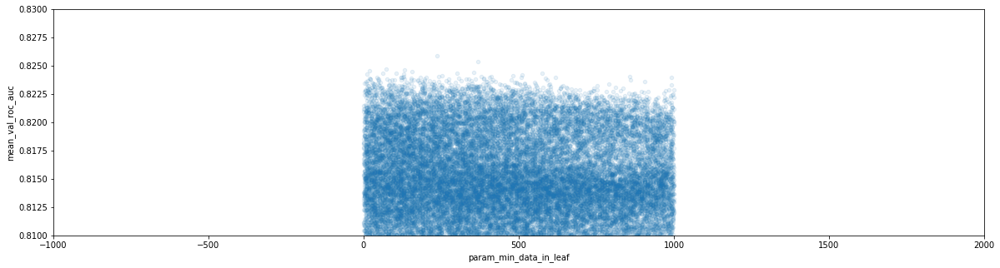

In [41]:
df.plot(x='param_min_data_in_leaf', y='mean_val_roc_auc', kind='scatter', alpha=0.1, 
        ylim=(0.81, 0.83), xlim=(-1000, 2000));

there is someone hiding in scale_pos_weight plot

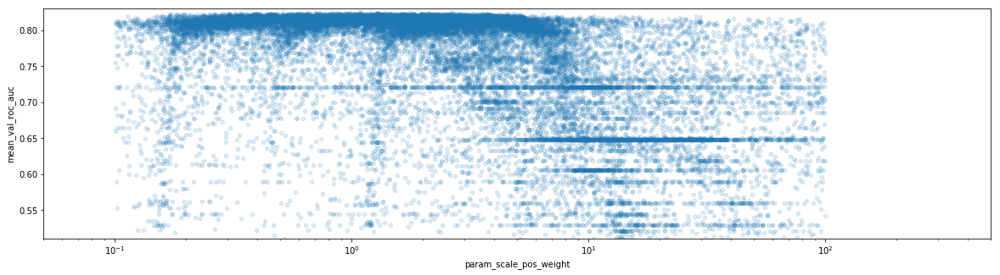

In [49]:
df.plot(x='param_scale_pos_weight', y='mean_val_roc_auc', kind='scatter', alpha=0.15, 
        logx=True, xlim=(0.05, 500),
        ylim=(0.51, 0.83));

### select best (by roc_auc) subset of experiments

In [11]:
df.mean_val_roc_auc.describe()

count    130823.000000
mean          0.638835
std           0.144965
min           0.231755
25%           0.500000
50%           0.549322
75%           0.806681
max           0.825910
Name: mean_val_roc_auc, dtype: float64

In [12]:
best_samples = df.sort_values('mean_val_roc_auc')[-10000:]

In [13]:
best_samples.describe()

,param_bagging_fraction,param_bagging_freq,param_bin_construct_sample_cnt,param_cat_l2,param_cat_smooth,param_feature_fraction,param_lambda_l1,param_lambda_l2,param_learning_rate,param_max_bin,param_max_cat_threshold,param_max_cat_to_onehot,param_max_delta_step,param_max_depth,param_min_data_in_bin,param_min_data_in_leaf,param_min_data_per_group,param_min_gain_to_split,param_min_sum_hessian_in_leaf,param_num_leaves,param_num_threads,param_scale_pos_weight,param_seed,param_verbosity,success,mean_train_accuracy,range_train_accuracy,mean_train_average_precision,range_train_average_precision,mean_train_f1,range_train_f1,mean_train_log_loss,range_train_log_loss,mean_train_precision,range_train_precision,mean_train_recall,range_train_recall,mean_train_roc_auc,range_train_roc_auc,mean_test_accuracy,range_test_accuracy,mean_test_average_precision,range_test_average_precision,mean_test_f1,range_test_f1,mean_test_log_loss,range_test_log_loss,mean_test_precision,range_test_precision,mean_test_recall,range_test_recall,mean_test_roc_auc,range_test_roc_auc,mean_val_accuracy,range_val_accuracy,mean_val_average_precision,range_val_average_precision,mean_val_f1,range_val_f1,mean_val_log_loss,range_val_log_loss,mean_val_precision,range_val_precision,mean_val_recall,range_val_recall,mean_val_roc_auc,range_val_roc_auc,test_overfit_accuracy,val_test_diff_accuracy,test_overfit_average_precision,val_test_diff_average_precision,test_overfit_f1,val_test_diff_f1,test_overfit_log_loss,val_test_diff_log_loss,test_overfit_precision,val_test_diff_precision,test_overfit_recall,val_test_diff_recall,test_overfit_roc_auc,val_test_diff_roc_auc,mean_train_time,mean_pred_time,mean_best_iteration,range_best_iteration
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0,3124.000000,10000.000000,10000.0,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.703192,496.378000,500452.803900,103.854376,49.425600,0.492481,6.141557,50.594808,0.700801,516.560200,249.642900,5.137200,1.653415,49.996800,50.382700,437.99520,516.999600,1.637078,0.701118,100.168500,1.0,1.763865,49527.322100,-1.0,1.0,0.746460,0.011833,0.609731,0.018769,0.579750,0.018472,0.499348,1.186952e-02,0.520515,0.026504,0.712213,0.033744,0.834765,0.007165,0.741430,0.027791,0.597446,0.071783,0.571835,0.040537,0.506150,0.038377,0.512549,0.054623,0.703306,0.060739,0.827608,0.026961,0.740152,0.011628,0.587622,0.015168,0.562606,0.018308,0.509313,8.542243e-03,0.511305,0.027091,0.679416,0.032772,0.819450,0.003832,0.005030,0.001278,0.012285,0.009825,0.007915,0.009230,-0.006803,-0.003163,0.007967,0.001244,0.008907,0.023890,0.007156,0.008158,0.745172,0.093156,719.121220,210.625300
std,0.198376,290.097801,289365.400873,199.776074,28.860928,0.168052,21.783040,151.662289,1.566964,293.427592,143.079813,2.527967,2.384952,28.876831,28.254658,278.44737,272.671621,9.993634,1.742162,56.824387,0.0,1.717302,28759.519989,0.0,0.0,0.023500,0.009063,0.014286,0.007403,0.120930,0.039314,0.039371,9.766996e-03,0.098398,0.082450,0.195710,0.050585,0.007131,0.002825,0.022791,0.009539,0.006271,0.0

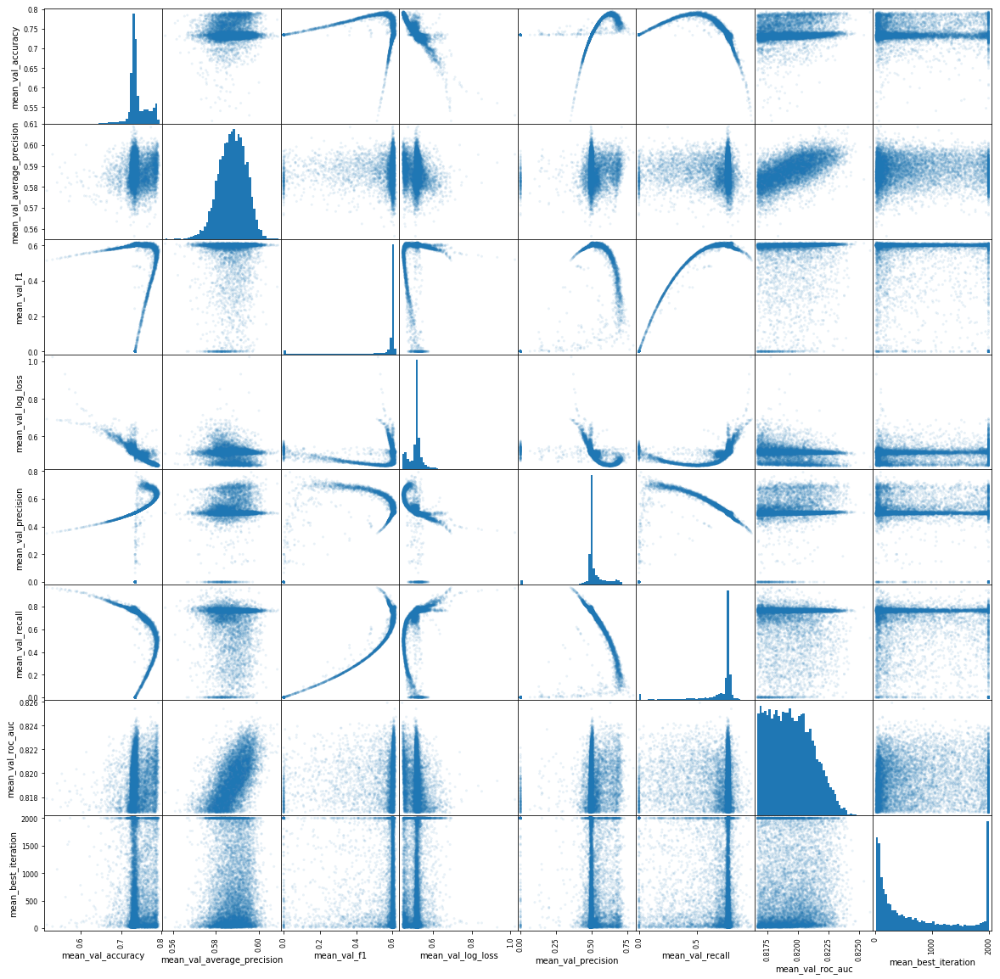

In [15]:
pd.plotting.scatter_matrix(best_samples[['mean_val_' + m for m in metrics] + ['mean_best_iteration']], alpha=0.1, 
                           figsize=(20, 20), hist_kwds={'bins': 50});

### dependencies between parameters on best subset

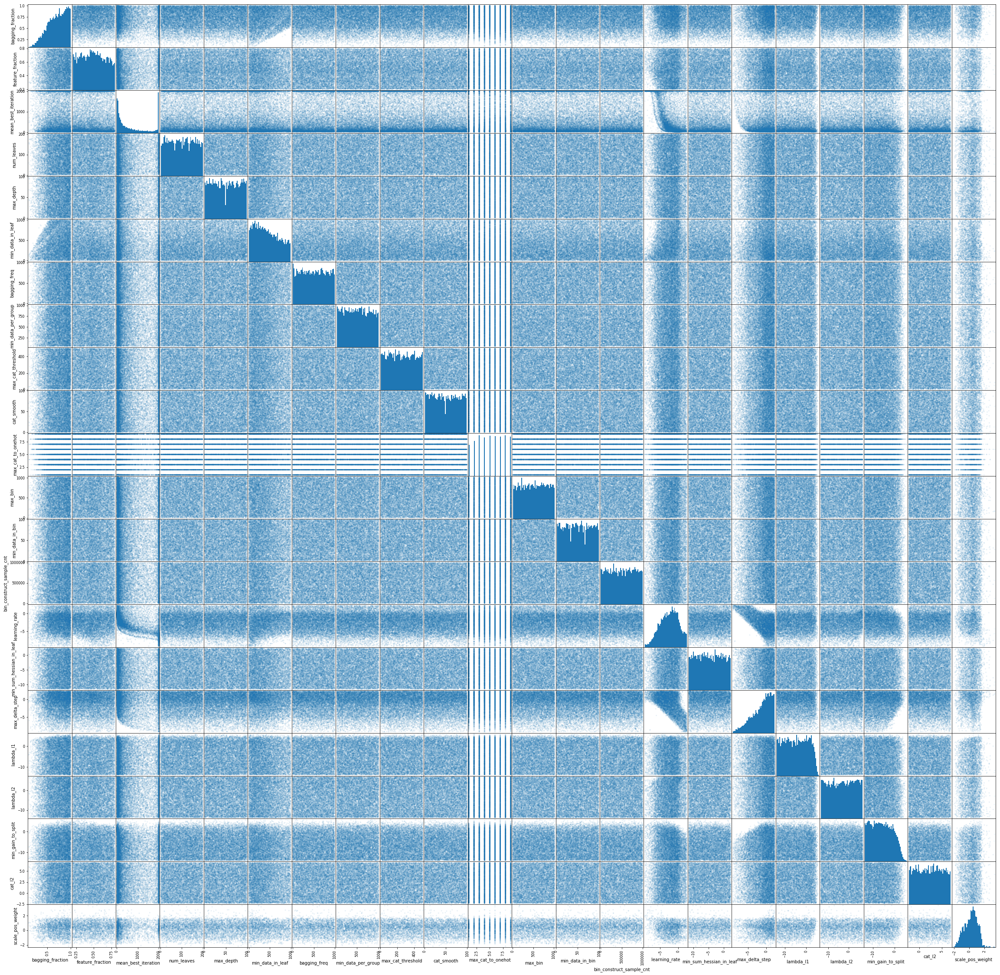

In [20]:
pd.plotting.scatter_matrix(
    pd.concat([best_samples[cont_parameters + int_parameters], np.log(best_samples[log_parameters])], 
              axis='columns').rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.1, figsize=(40, 40), hist_kwds={'bins': 50});